# **Group M (Mohamed Boutaleb, Francesco Moro)**

# Machine Learning Project - Diamond Analysis

## Introduction
In this notebook will be performed the analysis of the [diamond dataset](https://www.kaggle.com/shivam2503/diamonds), a collection of almost **54,000** diamonds.

In [1]:
### Keeping safe from any disaster :) ###
%autosave 30

Autosaving every 30 seconds


# **4C's Diamond**

<img src="./img/4cs.png" alt="drawing" width="400"/>

[Image source: Diamond Education Learning](https://www.youtube.com/watch?v=qJs6P7ChGd8)


### In a nutshell, to understand how much a diamond is worth, we should start with the basics, i.e. the 4 C's (CARAT, CLARITY, COLOR, CUT). These explain very well the quality of a diamond: 
* <span style="color:red"><b>Carat</span>: Carat is the weight of the diamond. Bigger the diamond, rare to find them.
* <span style="color:red"><b>Clarity</span>: Clarity of the diamond is intrusions in the diamond, which could be internal flaws, external defects.
* <span style="color:red"><b>Color</span>: Color of the diamond is self explinary, and on scale of AtoZ, A is best and colorless, where as Z is worst and yellowish color. The colorless diamonds are rare and costly.
* <span style="color:red"><b>Cut</span>: Cut of the diamond is about physical dimensions of the diamond. It determine the light amount enter into the diamond. Anotomy of the diamond is an important parameter.



# **Cut and Components**

<div style="display: flex;"><img src="./img/Diamond-Cut.jpg" alt="drawing" width="600"/> <img src="./img/Diamond-Components.jpg" alt="drawing" width="600"/></div>

### There are several things to consider to see in a diamond. Few such is **table%**, **depth%** and **cuts**. Diamond anotomy is given it the cut of the diamond infographic in the above image.
All the basic information about the diamond cut are givn above.
Side view of the diamond show the terminology and meaning of his features.
Thus table length, table width, diamond depth, depth%, and table% are very important features to determine the price of a diamond.

## **Libraries used**
For these analyses we used some libraries covered during the course and partly others based on their documentation. Below is the list:
* **numpy**
* **pandas**
* **plotly**
* **scikit learn**
* **ml_utilities**
* **ml_visualization**

* **seaborn**
* **matplotlib**

In [2]:
### Imports ###
import numpy as np
import pandas as pd

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly
import plotly.offline as py
import matplotlib.pyplot as plt

from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

from sklearn.dummy import DummyClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LinearRegression 
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge

from sklearn.model_selection import GridSearchCV, KFold, cross_val_score

import seaborn as sns
import matplotlib.pyplot as plt

import scipy.stats as st

import ml_utilities
import ml_visualization

## **Reading the dataset**
In order to properly import the dataset you need to:
* Download the zipper from [here](https://www.kaggle.com/shivam2503/diamonds)
* Extract it
* Move it into the current directory `./`.

In [3]:
### Reading .csv dataset ###
dfName = "diamonds.csv"
df = pd.read_csv(dfName)

## **Preliminary analysis**
### What are the columns?

In [4]:
### Describing the df characteristics ###
df.describe()

,Unnamed: 0,carat,depth,table,price,x,y,z
count,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000
mean,26970.500000,0.797940,61.749405,57.457184,3932.799722,5.731157,5.734526,3.538734
std,15571.281097,0.474011,1.432621,2.234491,3989.439738,1.121761,1.142135,0.705699
min,1.000000,0.200000,43.000000,43.000000,326.000000,0.000000,0.000000,0.000000
25%,13485.750000,0.400000,61.000000,56.000000,950.000000,4.710000,4.720000,2.910000
50%,26970.500000,0.700000,61.800000,57.000000,2401.000000,5.700000,5.710000,3.530000
75%,40455.250000,1.040000,62.500000,59.000000,5324.250000,6.540000,6.540000,4.040000
max,53940.000000,5.010000,79.000000,95.000000,18823.000000,10.740000,58.900000,31.800000


In [5]:
### How many non-null fields are there? ###
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53940 entries, 0 to 53939
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  53940 non-null  int64  
 1   carat       53940 non-null  float64
 2   cut         53940 non-null  object 
 3   color       53940 non-null  object 
 4   clarity     53940 non-null  object 
 5   depth       53940 non-null  float64
 6   table       53940 non-null  float64
 7   price       53940 non-null  int64  
 8   x           53940 non-null  float64
 9   y           53940 non-null  float64
 10  z           53940 non-null  float64
dtypes: float64(6), int64(2), object(3)
memory usage: 4.5+ MB


In [142]:
df.head()

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


## **Dropping and remapping columns**

In [7]:
### Dropping unnecessary column. Additional index ###
df.drop('Unnamed: 0', axis=1, inplace=True)

df_mapped=df.copy()

### Remapping all necessary columns
df_mapped['color'] = df['color'].replace(['J','I','H','G','F','E','D'],[1,2,3,4,5,6,7])
df_mapped['cut'] = df['cut'].replace(['Fair','Good','Very Good','Premium','Ideal'],[1,2,3,4,5])
df_mapped['clarity'] = df['clarity'].replace(['I3','I2','I1','SI2','SI1','VS2','VS1','VVS2','VVS1','IF'],[1,2,3,4,5,6,7,8,9,10])

## **First question we asked ourselves**
### Is there a correlation between price and carats?

In [8]:
fig = px.scatter(df_mapped, x="carat", y="price", title="Diamonds price basing on carats")
fig.show()

## **How do the other attributes of the diamond infer price?**

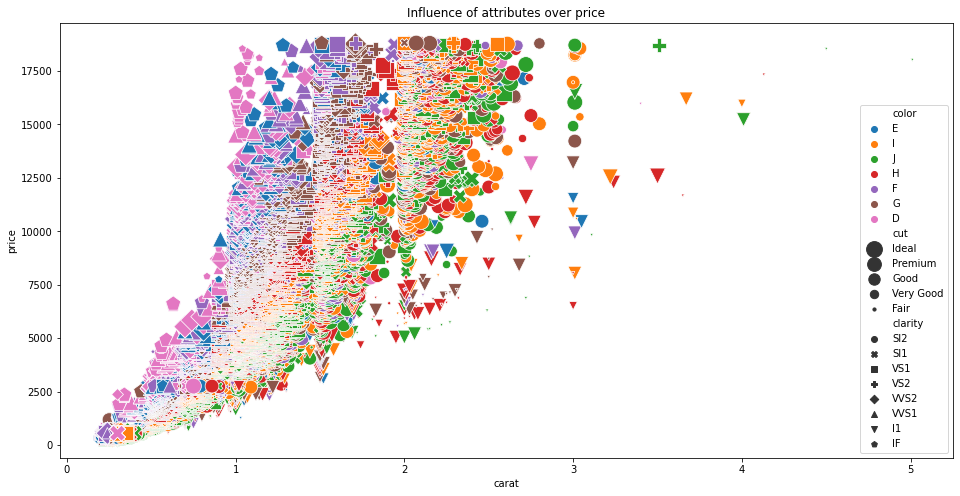

In [9]:
plt.figure(figsize=(16,8))
sns.scatterplot(data=df, x="carat", y="price", hue="color",size="cut", style="clarity", sizes=(10,250))
plt.title("Influence of attributes over price")
plt.show()

## **How do price quantiles change according to attributes?**
### We considered the attributes that should infer more

In [10]:
categoricalAttributes=["clarity", "cut", "color"]
targetVariable="price"

for attribute in categoricalAttributes:
    fig = px.box(data_frame=df_mapped,orientation="h",y=attribute,x="price",title=f"{targetVariable} related to {attribute}")
    fig.show()

## **What is the distribution of the diamonds in this Dataset according to attributes?**

Text(0.5, 0.98, 'Features distributions')

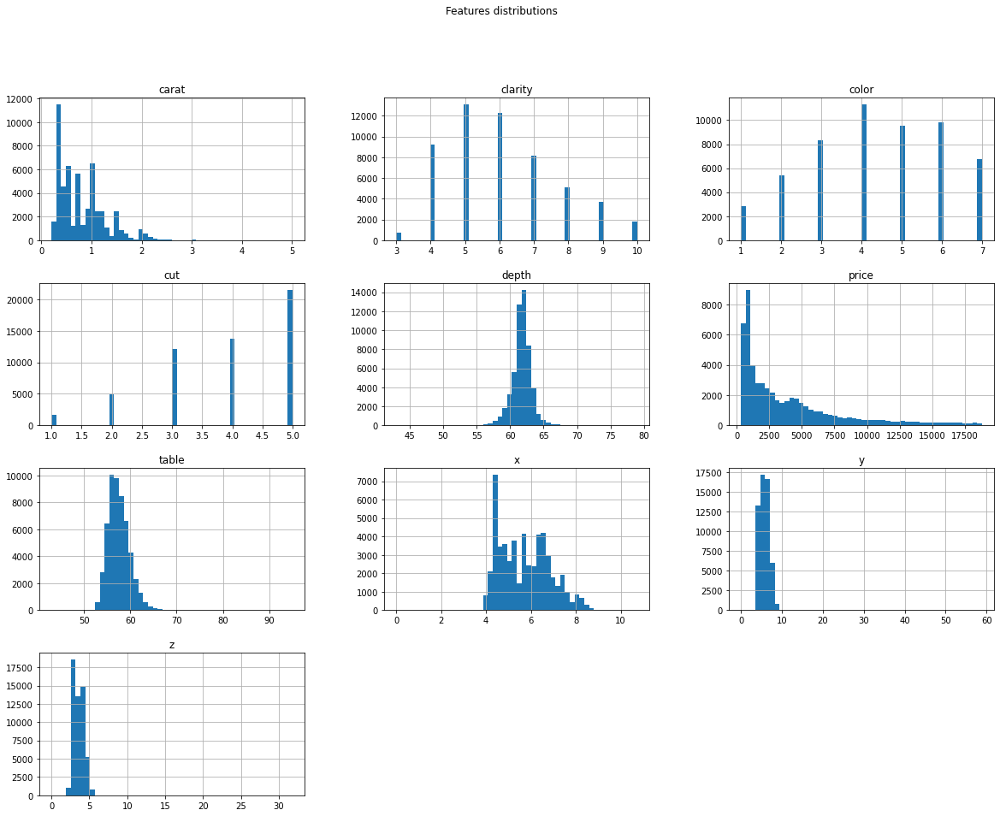

In [11]:
df_mapped.hist(bins=50, figsize=(20,15))
plt.suptitle("Features distributions")

# **Linear Regression**

## Computing correlation matrix to detect some linear patterns

In [12]:
### calculation of the correlation coefficient between price and all other fields ###
corr_matrix = df_mapped.corr()

print(corr_matrix["price"].sort_values(ascending = False))

price      1.000000
carat      0.921591
x          0.884435
y          0.865421
z          0.861249
table      0.127134
depth     -0.010647
cut       -0.053491
clarity   -0.146800
color     -0.172511
Name: price, dtype: float64


In [141]:
#split dataset in features and target variable
feature_cols = ['carat', 'table', 'x', 'y', 'z', 'depth']
# feature_cols = ['depth']
valid_portion=0.30
# df_sampled=df_mapped.sample(n=1000)
for i in feature_cols:
    X = df_mapped[i] # Features
    y = df_mapped.price.astype('float64') # Target variable

    train_x, validation_x, train_y, validation_y = train_test_split(X, y, test_size=valid_portion, random_state=1)
    
    train_x=train_x.values.reshape(-1, 1)
    validation_x=validation_x.values.reshape(-1, 1)
    
    train_y=train_y.values.reshape(-1, 1)
    validation_y=validation_y.values.reshape(-1, 1)
    
    # Addestramento di un LinearRegression
    lin_reg = LinearRegression()
    lin_reg.fit(train_x, train_y)

    # Ottenimento delle predizioni
    train_y_predicted = lin_reg.predict(train_x)

    # Calcolo del RMSE
    rmse = np.sqrt(mean_squared_error(train_y, train_y_predicted))
    print('Train RMSE: ', rmse) 

    # Ottenimento delle predizioni (validation) e calcolo RMSE
    validation_y_predicted = lin_reg.predict(validation_x)
    rmse = np.sqrt(mean_squared_error(validation_y, validation_y_predicted))
    print('Validation RMSE: ', rmse)
    print('R2 score:', lin_reg.score(validation_x, validation_y))
    
    w=lin_reg.coef_[0][0]
    b=lin_reg.intercept_
    
    y_hat = b +w*X
    
    x_line = np.array([np.min(X), np.max(X)]) # Prova a modificare gli estremi, per estrapolare la linea
    y_line = b + w*x_line

    data = [
        go.Scatter(x=X, y=y, mode="markers", name="data"),
        go.Scatter(x=X, y=y_hat, mode="markers", name="estimate"),
        go.Scatter(x=x_line, y=y_line, mode="lines", name="regression line"),
    ]

#     # Disegnamo le linee verticali corrispondenti agli errori (residui)
#     for i in range(len(X)):
#         data.append(go.Scatter(x=[X[i], X[i]], y=[y[i], y_hat[i]], mode="lines",
#             showlegend=False, line=dict(color="gray", width=0.5)),)

    layout = go.Layout(
        xaxis = dict(title="Hand length [mm]: variabile esplicativa"),
        yaxis = dict(title="Height [mm]: variabile target")
    )
    fig = go.Figure(data, layout)
#     py.iplot(fig)
    fig.write_image(f"{i}.png")

Train RMSE:  1560.5276938406769
Validation RMSE:  1520.3317090552023
R2 score: 0.8493196667739158
Train RMSE:  3987.536167459719
Validation RMSE:  3885.017951050689
R2 score: 0.016066098278325724
Train RMSE:  1877.118093178531
Validation RMSE:  1825.6024177121258
R2 score: 0.7827337495915477
Train RMSE:  2070.0363229147342
Validation RMSE:  1825.6734589316966
R2 score: 0.7827168399297663
Train RMSE:  2073.91823176725
Validation RMSE:  1915.4660086333242
R2 score: 0.7608178508319458
Train RMSE:  4019.899198428712
Validation RMSE:  3916.634223668388
R2 score: -1.3571168991033389e-05


Text(0.5, 1.0, 'Correlation matrics')

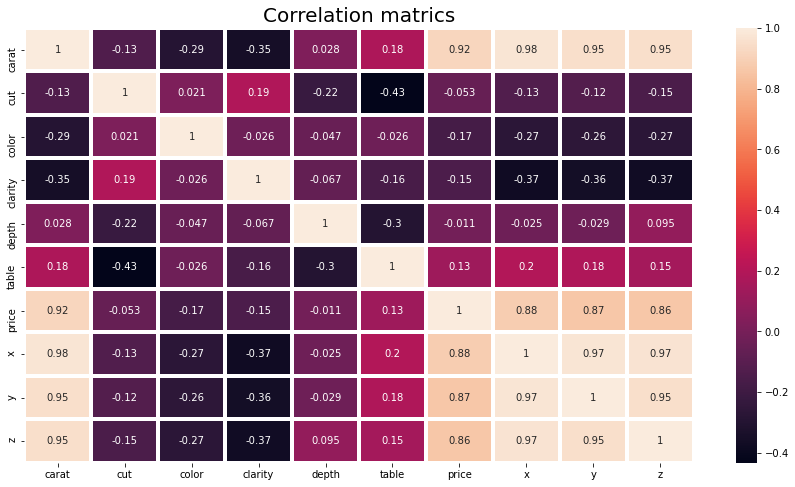

In [13]:
#Correlation with Price column
fig=plt.figure(figsize=(15,8))
sns.heatmap(df_mapped.corr(), linewidths=3, annot=True)
plt.title("Correlation matrics", size=20)

In [14]:
#split dataset in features and target variable
feature_cols = ['clarity', 'carat', 'cut', 'color','depth','table','x', 'y', 'z']
X = df_mapped[feature_cols] # Features
y = df_mapped.price.astype('float64') # Target variable

In [15]:
# split X and y into training and testing sets
valid_portion = 0.5

train_x, validation_x, train_y, validation_y = train_test_split(X, y, test_size=valid_portion, random_state=1)


## **Start with RandomForest to check efficiency**

In [16]:
# Addestramento di un RandomForestRegressor
rndfor_reg = RandomForestRegressor()
rndfor_reg.fit(train_x, train_y)

# Ottenimento delle predizioni
train_y_predicted = rndfor_reg.predict(train_x)

# Calcolo del RMSE
rmse = np.sqrt(mean_squared_error(train_y, train_y_predicted))
print('Train RMSE: ', rmse) 

# Ottenimento delle predizioni (validation) e calcolo RMSE
validation_y_predicted = rndfor_reg.predict(validation_x)
rmse = np.sqrt(mean_squared_error(validation_y, validation_y_predicted))
print('Validation RMSE: ', rmse)
print('R2 score:', rndfor_reg.score(validation_x, validation_y))

Train RMSE:  209.03538085427434
Validation RMSE:  556.9379653737074
R2 score: 0.9801037275654217


## **Check if the LinearRegressor can do better**

In [17]:
# Addestramento di un LinearRegression
lin_reg = LinearRegression()
lin_reg.fit(train_x, train_y)

# Ottenimento delle predizioni
train_y_predicted = lin_reg.predict(train_x)

# Calcolo del RMSE
rmse = np.sqrt(mean_squared_error(train_y, train_y_predicted))
print('Train RMSE: ', rmse) 

# Ottenimento delle predizioni (validation) e calcolo RMSE
validation_y_predicted = lin_reg.predict(validation_x)
rmse = np.sqrt(mean_squared_error(validation_y, validation_y_predicted))
print('Validation RMSE: ', rmse)
print('R2 score:', lin_reg.score(validation_x, validation_y))

Train RMSE:  1229.2485789721898
Validation RMSE:  1204.5442615091756
R2 score: 0.9069313108306197


In [18]:
len(df_mapped[feature_cols[0]].values)

53940

## **Doing a K-Fold Cross-Validation to check if it affects RMSE optimisation**

In [20]:
# Ottimizzazione con Cross-Validation
reg = RandomForestRegressor() 

param_grid = [{'n_estimators': [10, 50, 100], 'max_depth': [None, 2, 3], 'random_state': [1234]}]

# Con shuffle=False si otterranno fold temporalmente ordinate
# (se i pattern non sono stati precedentemente mescolati)
experiment_gscv = GridSearchCV(reg, param_grid, \
                               cv=KFold(n_splits=4), \
                               scoring='neg_mean_squared_error')

experiment_gscv.fit(X, y)

# Print results
print('Combinazioni di parametri:\n', experiment_gscv.cv_results_['params'])
print('RMSE medio per combinazione:\n', np.sqrt(-experiment_gscv.cv_results_['mean_test_score']))
print('Combinazione migliore:\n', experiment_gscv.best_params_)
print('RMSE medio della combinazione migliore: %.3f' % np.sqrt(-experiment_gscv.best_score_))

Combinazioni di parametri:
 [{'max_depth': None, 'n_estimators': 10, 'random_state': 1234}, {'max_depth': None, 'n_estimators': 50, 'random_state': 1234}, {'max_depth': None, 'n_estimators': 100, 'random_state': 1234}, {'max_depth': 2, 'n_estimators': 10, 'random_state': 1234}, {'max_depth': 2, 'n_estimators': 50, 'random_state': 1234}, {'max_depth': 2, 'n_estimators': 100, 'random_state': 1234}, {'max_depth': 3, 'n_estimators': 10, 'random_state': 1234}, {'max_depth': 3, 'n_estimators': 50, 'random_state': 1234}, {'max_depth': 3, 'n_estimators': 100, 'random_state': 1234}]
RMSE medio per combinazione:
 [1858.5211656  1806.64242055 1770.62353266 2892.45112031 2868.41034669
 2875.19755245 2506.29438524 2488.8674007  2496.64787653]
Combinazione migliore:
 {'max_depth': None, 'n_estimators': 100, 'random_state': 1234}
RMSE medio della combinazione migliore: 1770.624


## **Is there a non-linear correlation between price and other attributes?**

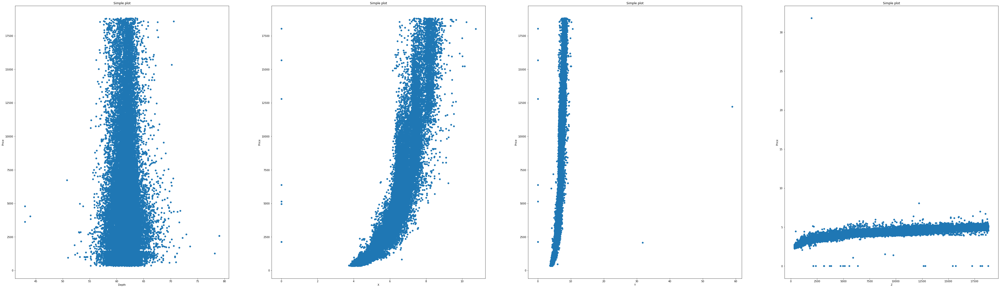

In [66]:
allGraphs=[]

fig, ax = plt.subplots(1, 4, figsize=(70, 20))
ax[0].scatter(x = df_mapped["depth"], y = df_mapped["price"])
ax[0].set_xlabel("Depth")
ax[0].set_ylabel("Price")
ax[0].set_title('Simple plot')

ax[1].scatter(x =df_mapped["x"], y=df_mapped["price"])
ax[1].set_xlabel("X")
ax[1].set_ylabel("Price")
ax[1].set_title('Simple plot')
                    
ax[2].scatter(x = df_mapped["y"], y = df_mapped["price"])
ax[2].set_xlabel("Y")
ax[2].set_ylabel("Price")
ax[2].set_title('Simple plot')

ax[3].scatter(y =df_mapped["z"], x=df_mapped["price"])
ax[3].set_xlabel("Z")
ax[3].set_ylabel("Price")
ax[3].set_title('Simple plot')

plt.show()

In [ ]:
fig, ax = plt.subplots(2, figsize=(70, 50))

ax[1].scatter(x = df_mapped["y"], y = df_mapped["price"])
ax[1].set_xlabel("Y")
ax[1].set_ylabel("Price")
ax[1].set_title('Simple plot')

ax[0].scatter(x =df_mapped["z"], y=df_mapped["price"])
ax[0].set_xlabel("Z")
ax[0].set_ylabel("Price")
ax[0].set_title('Simple plot')

plt.savefig("non_linear_1.png", dpi=300)

## **What happens if we remove the outliers (z-score >3 or z-score <-3)?**
### It would be useful to count how many outliers are there per-columns 

In [22]:
Q1 = df_mapped.quantile(0.25)
Q3 = df_mapped.quantile(0.75)
IQR=Q3-Q1
df_clean=df_mapped[~((df_mapped<(Q1-1.5*IQR))|(df_mapped>(Q3+1.5*IQR))).any(axis=1)]

cols = df_mapped.columns
all_z_scores=pd.DataFrame()

for col in cols:
    col_zscore = col + '_zscore'
    all_z_scores[col_zscore] = (df_mapped[col] - df_mapped[col].mean())/df_mapped[col].std(ddof=0)

all_outliers={}
arr=[]

for col in all_z_scores.columns:
    all_outliers[col+"_outlier"]=np.sum(all_z_scores[col]>3)+np.sum(all_z_scores[col]<-3)
    
outliers=pd.DataFrame(all_outliers, index=[0])
outliers=outliers.sort_values(by=0, axis=1, ascending=True)
px.histogram(y=outliers.columns, x=outliers.loc[0], title="Number of outliers by every column in the dataframe",labels={ # replaces default labels by column name
                "sum of x": "Number of outliers",  "y": "Column"
            })

## **Could the R2 score improve if we do testing on the dataset without the outliers?**
### We expected it to be a lot better but...

In [23]:
feature_cols = ['clarity', 'carat', 'cut', 'color','depth','table','x', 'y', 'z']
X_outliers = df_clean[feature_cols] # Features
y_outliers = df_clean.price.astype('float64') # Target variable
# split X and y into training and testing sets
valid_portion = 0.5
# Split random to train, test set
train_x_outliers, validation_x_outliers, train_y_outliers, validation_y_outliers = train_test_split(X_outliers, y_outliers, test_size=valid_portion, random_state=1)
    
print('R2 score:', rndfor_reg.score(validation_x_outliers, validation_y_outliers)) # R2 score migliora minimamente

R2 score: 0.9875154288851534


## **Lasso**
### Do Lasso to check the columns that infers more

In [24]:
def linear_regression(data, power, models_to_plot):
    #initialize predictors:
    predictors=['y']
    if power>=2:
        predictors.extend(['y_{}'.format(i) for i in range(2,power+1)])
    
    #Fit the model
    linreg = LinearRegression(normalize=True)
    linreg.fit(data[predictors],data['price'])
    y_pred = linreg.predict(data[predictors])
    
#     data=data.sort_values("y")
    
    #Check if a plot is to be made for the entered power
    if power in models_to_plot:
        plt.subplot(models_to_plot[power])
        plt.tight_layout()
        plt.plot(data['y'],y_pred)
        plt.plot(data['y'],data['price'],'.')
        plt.title('Plot for power: {}'.format(power))
    
    #Return the result in pre-defined format
    rss = sum((y_pred-data['price'])**2)
    ret = [rss]
    ret.extend([linreg.intercept_])
    ret.extend(linreg.coef_)
    return ret

In [67]:
def ridge_regression(data, predictors, alpha, models_to_plot={}):
    #Fit the model
    ridgereg = Ridge(alpha=alpha,normalize=True)
    ridgereg.fit(data[predictors],data['price'])
    y_pred = ridgereg.predict(data[predictors])
    
    #Check if a plot is to be made for the entered alpha
    if alpha in models_to_plot:
        plt.subplot(models_to_plot[alpha])
        plt.plot(y_pred, data['z'])
        plt.plot(data['price'], data['z'],'.')
        plt.title("%d, you have %d years left until you turn 18." % (alpha, alpha))
    
    #Return the result in pre-defined format
    rss = sum((y_pred-data['price'])**2)
    ret = [rss]
    ret.extend([ridgereg.intercept_])
    ret.extend(ridgereg.coef_)
    return ret

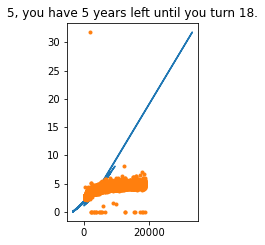

In [71]:
colname = 'z_2'      #new var will be x_power
df_mapped[colname] = np.sqrt(df_mapped['z'])

predictors=['z', 'z_2']

alpha_ridge = [1e-15, 1e-10, 1e-8, 1e-4, 1e-3,1e-2, 1, 5, 10, 5000]

#Initialize the dataframe for storing coefficients.
col = ['rss','intercept'] + ['coef_z','coef_z_e']
ind = ['alpha_{}'.format(alpha_ridge[i]) for i in range(len(alpha_ridge))]
coef_matrix_ridge = pd.DataFrame(index=ind, columns=col)

models_to_plot = {5:231}
for i in range(len(alpha_ridge)):
    ridge_regression(df_mapped, predictors,  alpha_ridge[i], models_to_plot)

In [27]:
coef_matrix_ridge

,rss,intercept,coef_z,coef_z_e
alpha_1e-15,NaN,NaN,NaN,NaN
alpha_1e-10,NaN,NaN,NaN,NaN
alpha_1e-08,NaN,NaN,NaN,NaN
alpha_0.0001,NaN,NaN,NaN,NaN
alpha_0.001,NaN,NaN,NaN,NaN
alpha_0.01,NaN,NaN,NaN,NaN
alpha_1,NaN,NaN,NaN,NaN
alpha_5,NaN,NaN,NaN,NaN
alpha_10,NaN,NaN,NaN,NaN
alpha_5000,NaN,NaN,NaN,NaN


# **Classification**

<Figure size 800x640 with 0 Axes>

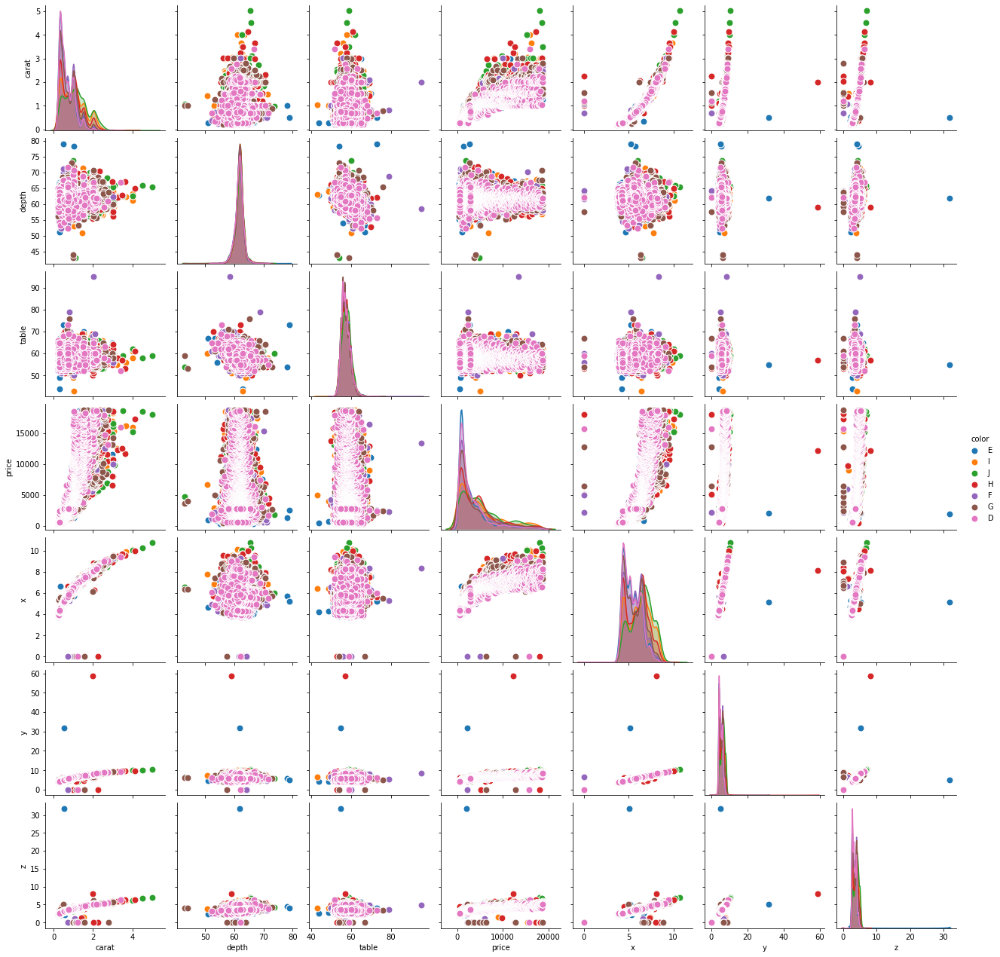

In [28]:
plt.figure(figsize=(10,8), dpi= 80)
sns.pairplot(df, kind="scatter", hue="color", plot_kws=dict(s=80, edgecolor="white", linewidth=1.0))
plt.show()

## ** How much should we spend on average for a diamond with certain characteristics? **

In [58]:
def display_price(df, age = (1,7), price = (100,100000), vehicle_type = "all", state = "all"):
    # Display the median price of vehicles depending on its type and its state.

    df = df[(df[vehicle_type] <= age[1]) & (df[vehicle_type] >= age[0])]

    df = df[(df["price"] >= price[0]) & (df["price"] <= price[1])]

    price_age = pd.pivot_table(df, values = "price", index = vehicle_type, aggfunc= np.median)
    price_age.columns = ["Median Price"]

    fig = plt.figure(figsize=(12,6))
    ax = fig.add_axes([0,0,1,1])
    ax2 = fig.add_axes([0.6,0.47,.35,.35])

    ax.plot(price_age["Median Price"], lw = 5)

    ax2.set_title(f"Column type: {vehicle_type}\nNumber of diamonds: {df.shape[0]}", fontsize = 15)
    ax2.axis('off')

    ax.set_title(f"Median price by {vehicle_type} of the diamonds",fontsize=25)
    ax.set_ylim(0,price_age["Median Price"].max()+1000)
    ax.set_xlabel(vehicle_type, fontsize = 15)
    ax.set_ylabel("Median price in $", fontsize = 15)

    ax.tick_params(axis='both', which='major', labelsize=15) 

    plt.savefig(f"medians{vehicle_type}.png",dpi=300, bbox_inches='tight')


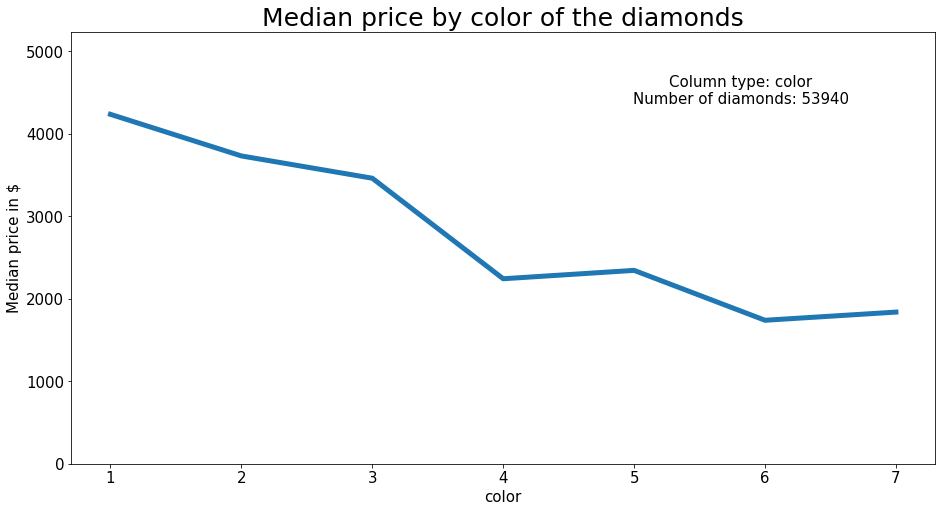

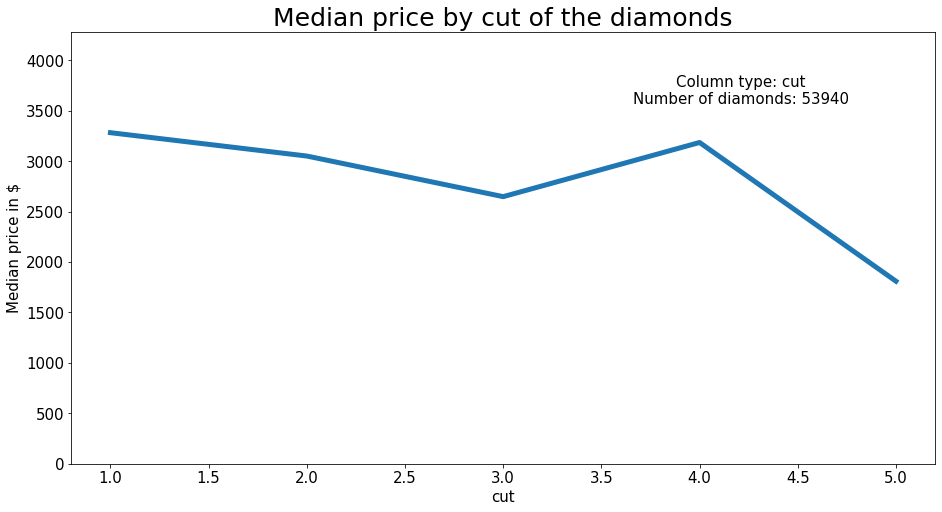

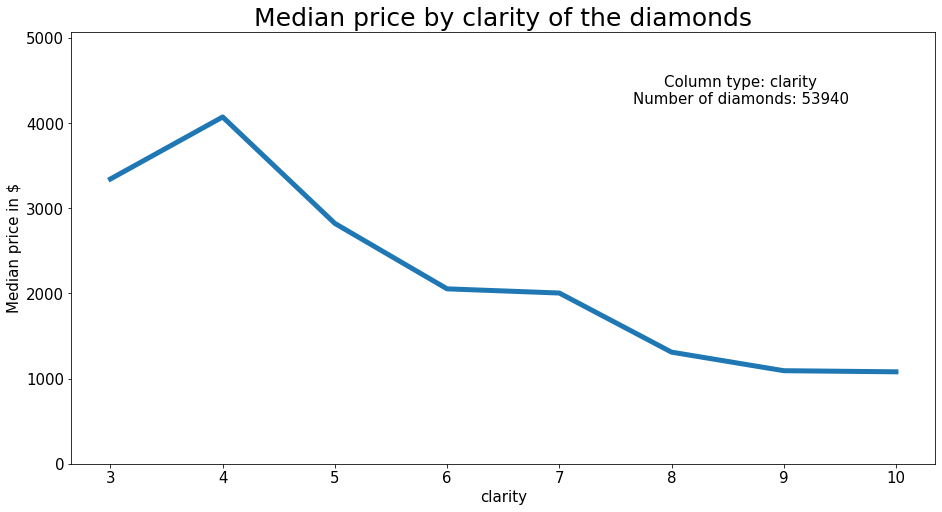

In [59]:
display_price(df_mapped, vehicle_type="color")
display_price(df_mapped,age=(1, 5), vehicle_type="cut")
display_price(df_mapped,age=(3, 10), vehicle_type="clarity")

In [31]:
def euclidean_distance(row1, row2):
    distance = 0.0
    for i in range(len(row1)-1):
        distance += (row1[i] - row2[i])**2
    return sqrt(distance)

In [32]:
# Locate the most similar neighbors
def get_neighbors(train, test_row, num_neighbors):
    distances = list()
    for train_row in train:
        dist = euclidean_distance(test_row, train_row)
        distances.append((train_row, dist))
    distances.sort(key=lambda tup: tup[1])
    neighbors = list()
    for i in range(num_neighbors):
        neighbors.append(distances[i][0])
    return neighbors


# neighbors = get_neighbors(dataset, dataset[0], 3)
# for neighbor in neighbors:
#     print(neighbor)

In [33]:
# Make a classification prediction with neighbors
def predict_classification(train, test_row, num_neighbors):
    neighbors = get_neighbors(train, test_row, num_neighbors)
    output_values = [row[-1] for row in neighbors]
    prediction = max(set(output_values), key=output_values.count)
    return prediction

# prediction = predict_classification(df, dataset[0], 3)
# print('Expected %d, Got %d.' % (df[0][-1], prediction))

In [34]:
set(df_mapped["clarity"])

{3, 4, 5, 6, 7, 8, 9, 10}

In [35]:
set(df_mapped["color"])

{1, 2, 3, 4, 5, 6, 7}

In [36]:
df_mapped

,carat,cut,color,clarity,depth,table,price,x,y,z,y_2
0,0.23,5,6,4,61.5,55.0,326,3.95,3.98,2.43,15.8404
1,0.21,4,6,5,59.8,61.0,326,3.89,3.84,2.31,14.7456
2,0.23,2,6,7,56.9,65.0,327,4.05,4.07,2.31,16.5649
3,0.29,4,2,6,62.4,58.0,334,4.20,4.23,2.63,17.8929
4,0.31,2,1,4,63.3,58.0,335,4.34,4.35,2.75,18.9225
...,...,...,...,...,...,...,...,...,...,...,...
53935,0.72,5,7,5,60.8,57.0,2757,5.75,5.76,3.50,33.1776
53936,0.72,2,7,5,63.1,55.0,2757,5.69,5.75,3.61,33.0625
53937,0.70,3,7,5,62.8,60.0,2757,5.66,5.68,3.56,32.2624
53938,0.86,4,3,4,61.0,58.0,2757,6.15,6.12,3.74,37.4544


In [101]:
def set_df_last_column(df, column_name):
    df_col=df.drop(column_name, axis=1)
    df_col[column_name]=df[column_name]
    print(df_col)
    return df_col


df_color=set_df_last_column(df_mapped, "cut")

X = df_color.iloc[:, :-1].values
y = df_color.iloc[:, len(df_mapped.columns)-1].values


       carat  color  clarity  depth  table  price     x     y     z      y_2  \
0       0.23      6        4   61.5   55.0    326  3.95  3.98  2.43  15.8404   
1       0.21      6        5   59.8   61.0    326  3.89  3.84  2.31  14.7456   
2       0.23      6        7   56.9   65.0    327  4.05  4.07  2.31  16.5649   
3       0.29      2        6   62.4   58.0    334  4.20  4.23  2.63  17.8929   
4       0.31      1        4   63.3   58.0    335  4.34  4.35  2.75  18.9225   
...      ...    ...      ...    ...    ...    ...   ...   ...   ...      ...   
53935   0.72      7        5   60.8   57.0   2757  5.75  5.76  3.50  33.1776   
53936   0.72      7        5   63.1   55.0   2757  5.69  5.75  3.61  33.0625   
53937   0.70      7        5   62.8   60.0   2757  5.66  5.68  3.56  32.2624   
53938   0.86      3        4   61.0   58.0   2757  6.15  6.12  3.74  37.4544   
53939   0.75      7        4   62.2   55.0   2757  5.83  5.87  3.64  34.4569   

            z_2  cut  
0      1.558846 

In [102]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)

In [103]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)

X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [104]:
from sklearn.neighbors import KNeighborsClassifier
classifier = KNeighborsClassifier(n_neighbors=5)
classifier.fit(X_train, y_train)

KNeighborsClassifier()

In [105]:
y_pred = classifier.predict(X_test)

In [106]:
from sklearn.metrics import classification_report, confusion_matrix
print(confusion_matrix(y_test, y_pred))
classification_report(y_test, y_pred)

[[ 222   65    7    7    3]
 [  39  530  295  120   31]
 [   1  291  860  710  611]
 [   0   54  563 1793  291]
 [   3   18  335  262 3677]]


'              precision    recall  f1-score   support\n\n           1       0.84      0.73      0.78       304\n           2       0.55      0.52      0.54      1015\n           3       0.42      0.35      0.38      2473\n           4       0.62      0.66      0.64      2701\n           5       0.80      0.86      0.83      4295\n\n    accuracy                           0.66     10788\n   macro avg       0.65      0.62      0.63     10788\nweighted avg       0.64      0.66      0.65     10788\n'

In [107]:
error = []

# Calculating error for K values between 1 and 40
for i in range(1, 20):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train, y_train)
    pred_i = knn.predict(X_test)
    error.append(np.mean(pred_i != y_test))

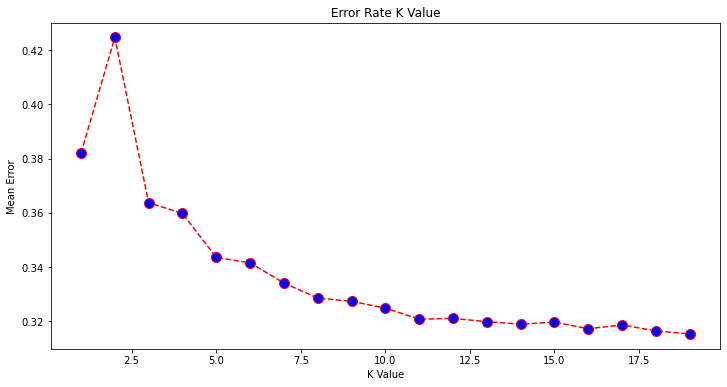

In [108]:
plt.figure(figsize=(12, 6))
plt.plot(range(1, 20), error, color='red', linestyle='dashed', marker='o',
         markerfacecolor='blue', markersize=10)
plt.title('Error Rate K Value')
plt.xlabel('K Value')
plt.ylabel('Mean Error')

plt.savefig("knn_color.png", dpi=300, bbox_inches='tight')

## **SVM**

In [ ]:
def getDatasetPatternsAndLabels(df, featureCount):
    patterns=[]
    labels=df.iloc[:, -1:].values.reshape(1,-1)[0]
    
    for i, row in df.iterrows():
        currentRow=[]
        for columnName in range(featureCount):
            currentRow.append(row[df.columns[columnName]])
        patterns.append(currentRow)
    
    return pd.DataFrame(patterns), pd.DataFrame(labels)[0]

In [ ]:
feature_count = 5

dfCut = set_df_last_column(df_mapped, "clarity")
dataset_patterns, dataset_labels = getDatasetPatternsAndLabels(dfCut, feature_count)

# print(dfCut.columns)

# print('Shape patterns:', dataset_patterns.shape)
# print('Shape labels:', dataset_labels.shape)
# print(dataset_patterns.head())
# print(dataset_labels.head())

In [ ]:
train_x, validation_x, train_y, validation_y = train_test_split(dataset_patterns, dataset_labels, test_size=0.25)
print('Shape training set:', train_x.shape)
print('Shape validation set:', validation_x.shape)

In [ ]:
# Creazione di un classificatore
# clf = DummyClassifier(strategy='most_frequent')
clf = SVC(kernel="linear", C=1)
# clf = SVC(kernel="rbf", C=1, gamma=0.1)

# Addestramento
clf.fit(train_x, train_y)

print('Classi predette:', clf.predict(validation_x[0:20]))
print('Classi reali:', validation_y[0:20])

In [ ]:
# Uso della funzione .score(...)
print('Accuratezza sul training set: %.3f' % clf.score(train_x, train_y))
print('Accuratezza sul validation set: %.3f' % clf.score(validation_x, validation_y))

In [ ]:
# Uso di show_results
# ml_visualization.show_2D_results(clf, (train_x, train_y, 'Training'), (validation_x, validation_y, 'Validation'))